# Financial services use in Tanzania

**The dataset contains demographic information and what financial services are used by approximately 10,000 individuals across Tanzania. This data was extracted from the FSDT Finscope 2017 survey and prepared specifically for this challenge.**

The purpose is this project is to investigate the relationships between 

In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np


# Examining the dataset

In [2]:
Tanzania = pd.read_csv('../Data/training.csv')
Tanzania

,ID,Q1,Q2,Q3,Q4,Q5,Q6,Q7,Q8_1,Q8_2,...,Q17,Q18,Q19,Latitude,Longitude,mobile_money,savings,borrowing,insurance,mobile_money_classification
0,5086,98,2,3,1,1,2,2,0,0,...,-1,4,4,-4.460442,29.811396,0,0,0,0,0
1,1258,40,1,1,3,5,1,1,1,0,...,4,1,4,-6.176438,39.244871,1,1,1,0,3
2,331,18,2,4,6,3,2,1,0,0,...,-1,1,1,-6.825702,37.652798,1,0,0,0,2
3,6729,50,1,1,3,1,1,1,0,0,...,-1,1,4,-3.372049,35.808307,1,0,1,0,3
4,8671,34,1,1,1,1,2,1,0,1,...,-1,1,4,-7.179645,31.039095,1,1,0,1,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7089,8378,57,2,3,3,1,2,2,0,1,...,-1,1,4,-5.811335,35.098103,0,1,0,0,1
7090,881,32,1,1,6,3,1,1,0,1,...,-1,1,1,-2.635156,32.945423,1,1,0,0,3
7091,6672,22,2,3,3,3,2,2,0,1,...,-1,4,4,-8.303729,31.059642,0,0,0,0,0
7092,5416,28,2,1,3,1,2,2,0,1,...,-1,1,4,-8.090712,35.836560,1,0,0,1,3


 * ##### This data frame consists of 7094 rows and 37 columns, this also means that there are 7094 individuals involved in survey/research

### Renaming columns

In [3]:
Tanzania.rename(columns={'Q1' : 'Age' , 
                         'Q2': 'Gender' , 
                         'Q3' : 'Marital_status', 
                         'Q4' : 'Highest_level_of_education_completed', 
                         'Q5' : 'Residential_ownership', 
                         'Q6': 'Land_ownership', 
                         'Q7' : 'Own_mobile_phone', 
                         'Q8_1' : 'Salaries/wages', 
                         'Q8_2' : 'Selling_products/goods', 
                         'Q8_3':'Providing_services',
                         'Q8_4': 'Piece_jobs', 
                         'Q8_5' : 'Rental_income' , 
                         'Q8_6' :'Saving/investments', 
                         'Q8_7': 'Pension', 
                         'Q8_8': 'Government_grants', 
                         'Q8_9' : 'Money_given_by_someone', 
                         'Q8_10' : 'No_income', 
                         'Q8_11' : 'Other', 
                         'Q9' : 'Work_info_for_salary_earners',
                         'Q10' : 'Sellers_good/products', 
                         'Q11' : 'Services_from_Providers', 
                         'Q12' : 'Money_sent_for_the_past_12_months', 
                         'Q13' : 'Last_time_money_sent', 
                         'Q14' : 'Money_received_in_past_12_months', 
                         'Q15': 'Last_time_money_received', 
                         'Q16' : 'Frequency_of_Mobile_money_goods/services_purchases', 
                         'Q17' : 'Frequency_of_Mobile_money_bill_payments', 
                         'Q18' : 'Literacy_in_Kiswhahili', 
                         'Q19' : 'Literacy_in_English', }, 
                inplace=True)

In [4]:
list(Tanzania.columns)

['ID',
 'Age',
 'Gender',
 'Marital_status',
 'Highest_level_of_education_completed',
 'Residential_ownership',
 'Land_ownership',
 'Own_mobile_phone',
 'Salaries/wages',
 'Selling_products/goods',
 'Providing_services',
 'Piece_jobs',
 'Rental_income',
 'Saving/investments',
 'Pension',
 'Government_grants',
 'Money_given_by_someone',
 'No_income',
 'Other',
 'Work_info_for_salary_earners',
 'Sellers_good/products',
 'Services_from_Providers',
 'Money_sent_for_the_past_12_months',
 'Last_time_money_sent',
 'Money_received_in_past_12_months',
 'Last_time_money_received',
 'Frequency_of_Mobile_money_goods/services_purchases',
 'Frequency_of_Mobile_money_bill_payments',
 'Literacy_in_Kiswhahili',
 'Literacy_in_English',
 'Latitude',
 'Longitude',
 'mobile_money',
 'savings',
 'borrowing',
 'insurance',
 'mobile_money_classification']

In [5]:
Tanzania.head()

,ID,Age,Gender,Marital_status,Highest_level_of_education_completed,Residential_ownership,Land_ownership,Own_mobile_phone,Salaries/wages,Selling_products/goods,...,Frequency_of_Mobile_money_bill_payments,Literacy_in_Kiswhahili,Literacy_in_English,Latitude,Longitude,mobile_money,savings,borrowing,insurance,mobile_money_classification
0,5086,98,2,3,1,1,2,2,0,0,...,-1,4,4,-4.460442,29.811396,0,0,0,0,0
1,1258,40,1,1,3,5,1,1,1,0,...,4,1,4,-6.176438,39.244871,1,1,1,0,3
2,331,18,2,4,6,3,2,1,0,0,...,-1,1,1,-6.825702,37.652798,1,0,0,0,2
3,6729,50,1,1,3,1,1,1,0,0,...,-1,1,4,-3.372049,35.808307,1,0,1,0,3
4,8671,34,1,1,1,1,2,1,0,1,...,-1,1,4,-7.179645,31.039095,1,1,0,1,3


### Mapping columns  

In [6]:
# Gender
assign_gen = {2:'Female', 
              1:'Male'}
Tanzania['Gender'] = Tanzania['Gender'].map(assign_gen)



# Marital status
assign_ms = {1:'Married', 
             2:'Divorced', 
             3:'Widowed', 
             4:'Single'}
Tanzania['Marital_status'] = Tanzania['Marital_status'].map(assign_ms)



# Residential_ownership
assign_ron = {1:'Personally own a plot', 
              2:'Joint ownership', 
              3:'Household member owns a plot', 
              4:'Rented plot', 
              5:'Dont own or rent the land', 
              6:'Dont know'}
Tanzania['Residential_ownership'] = Tanzania['Residential_ownership'].map(assign_ron)



# Land_ownership
assign_lon = {1:'Yes', 
              2:'No'}
Tanzania['Land_ownership'] = Tanzania['Land_ownership'].map(assign_lon)



# Own_mobile_phone
assign_omp = {1:'Yes', 
              2:'No'}
Tanzania['Own_mobile_phone'] = Tanzania['Own_mobile_phone'].map(assign_omp)



# Salaries/wages
assign_sw = {1:'Yes', 
             0:'No'}
Tanzania['Salaries/wages'] = Tanzania['Salaries/wages'].map(assign_sw) 



# Selling_products/goods
assign_spg = {1:'Yes', 
              0:'No'}
Tanzania['Selling_products/goods'] = Tanzania['Selling_products/goods'].map(assign_spg)



# Providing_services
assign_ps = {1:'Yes', 
             0:'No'}
Tanzania['Providing_services'] = Tanzania['Providing_services'].map(assign_ps)



# 'Piece_jobs'
assign_pj = {1:'Yes', 
             0:'No'}
Tanzania['Piece_jobs'] = Tanzania['Piece_jobs'].map(assign_pj)



# Highest_level_of_qualification
assign_hq= {1:'No formal education', 
            2:'Some primary', 
            3:'Primary completed', 
            4:'Post primary technical training', 
            5:'Some secondary', 
            6: 'University or other higher education', 
            7: 'Don’t know'}
Tanzania['Highest_level_of_education_completed'] = Tanzania['Highest_level_of_education_completed'].map(assign_hq)



# 'Rental_income'
assign_ri = {1:'Yes', 
             0:'No'}
Tanzania['Rental_income'] = Tanzania['Rental_income'].map(assign_ri)



# 'Saving/investments'
assign_si = {1:'Yes', 
             0:'No'}
Tanzania['Saving/investments'] = Tanzania['Saving/investments'].map(assign_si)



# 'Pension'
assign_pn = {1:'Yes', 
             0:'No'}
Tanzania['Pension'] = Tanzania['Pension'].map(assign_pn)



# 'Government_grants'
assign_gg = {1:'Yes', 
             0:'No'}
Tanzania['Government_grants'] = Tanzania['Government_grants'].map(assign_gg)



# 'Money_given_by_someone'
assign_mgs = {1:'Yes', 
              0:'No'}
Tanzania['Money_given_by_someone'] = Tanzania['Money_given_by_someone'].map(assign_mgs)



# 'No_income'
assign_ni = {1:'Yes', 
             0:'No'}
Tanzania['No_income'] = Tanzania['No_income'].map(assign_ni)



# 'Other'
assign_oo = {1:'Yes', 
             0:'No'}
Tanzania['Other'] = Tanzania['Other'].map(assign_oo)



# 'Work_info_for_salary earners'
assign_wis = {-1 :'n/a', 
              1:'Government', 
              2: 'Private company/business', 
              3: 'Business owner', 
              4: 'Small scale farmer', 
              5: 'Commercial farmer', 
              6: 'Work for individual/household', 
              7: 'Other'  }
Tanzania['Work_info_for_salary_earners'] = Tanzania['Work_info_for_salary_earners'].map(assign_wis)



# Sellers_products/goods
assign_sps = {-1:'n/a', 
              1:'Grown crops/produce', 
              2: 'Products from livestock', 
              3: 'Livestock', 
              4: 'Aquaculture', 
              5: 'Agricultural products', 
              6: 'Non-agricultural products', 
              7: 'Hand-crafted', 
              8: 'Nature-collection', 
              9: 'Processed products', 
              10: 'Other'}
Tanzania['Sellers_good/products'] = Tanzania['Sellers_good/products'].map(assign_sps)



# Services_from_Providers
assign_sfp = {-1 :'n/a', 
              1:'Personal services', 
              2: 'Telecommunications/IT', 
              3: 'Financial services', 
              4: 'Transport', 
              5: 'Hospitality', 
              6: 'Information/research', 
              7: 'Technical', 
              8: 'Educational/child care', 
              9: 'Health services', 
              10: 'Legal services', 
              11: 'Security', 
              12: 'Other'}
Tanzania['Services_from_Providers'] = Tanzania['Services_from_Providers'].map(assign_sfp)



# Money_sent_for_the_past_12_months
assign_msy = {1:'Yes', 
              2:'No'}
Tanzania['Money_sent_for_the_past_12_months'] = Tanzania['Money_sent_for_the_past_12_months'].map(assign_msy)



# Money_received_in_past_12_months
assign_mry = {1:'Yes', 
              2:'No'}
Tanzania['Money_received_in_past_12_months'] = Tanzania['Money_received_in_past_12_months'].map(assign_mry)




# Last_time_money_sent
assign_lms = {-1:'n/a', 
              1:'Yesterday/today', 
              2: 'Past 7 days', 
              3: 'Past 30 days', 
              4: 'past 90 days', 
              5: 'Over 90 days to 6 months', 
              6: 'over 6 months'}
Tanzania['Last_time_money_sent'] = Tanzania['Last_time_money_sent'].map(assign_lms)



# Last_time_money_received
assign_lmr = {-1:'n/a', 
              1:'Yesterday/today', 
              2: 'Past 7 days', 
              3: 'Past 30 days', 
              4: 'past 90 days', 
              5: 'Over 90 days to 6 months', 
              6: 'over 6 months'}
Tanzania['Last_time_money_received'] = Tanzania['Last_time_money_received'].map(assign_lmr)



# Frequency_of_Mobile_money_goods/services_purchases
assign_fmp = {-1:'n/a', 
              1:'never', 
              2: 'Daily', 
              3: 'Weekly', 
              4: 'Monthly', 
              5: 'less often'}
Tanzania['Frequency_of_Mobile_money_goods/services_purchases'] = Tanzania['Frequency_of_Mobile_money_goods/services_purchases'].map(assign_fmp)



# Frequency_of_Mobile_money_bill_payments
assign_fmb = {-1:'n/a', 
              1:'never', 
              2: 'Daily', 
              3: 'Weekly', 
              4: 'Monthly', 
              5: 'less often'}
Tanzania['Frequency_of_Mobile_money_bill_payments'] = Tanzania['Frequency_of_Mobile_money_bill_payments'].map(assign_fmb)



# Literacy_in_Kiswhahili
assign_lik = {1:'Can read and write', 
              2: 'Read only', 
              3: 'Write only', 
              4: 'neither read/write', 
              5: 'refused to read'}
Tanzania['Literacy_in_Kiswhahili'] = Tanzania['Literacy_in_Kiswhahili'].map(assign_lik)
   

    
# Literacy_in_English
assign_lie = {1:'Can read and write', 
              2: 'Read only', 
              3: 'Write only', 
              4: 'neither read/write', 
              5: 'refused to read'}
Tanzania['Literacy_in_English'] = Tanzania['Literacy_in_English'].map(assign_lie)



# mobile_money
assign_ = {1:'Yes', 
           0:'No'}
Tanzania['mobile_money'] = Tanzania['mobile_money'].map(assign_oo)



# savings
assign_sv = {1:'Yes', 
             0:'No'}
Tanzania['savings'] = Tanzania['savings'].map(assign_sv)



# borrowing
assign_br = {1:'Yes', 
             0:'No'}
Tanzania['borrowing'] = Tanzania['borrowing'].map(assign_br)
 

    
# insurance
assign_ins = {1:'Yes', 
              0:'No'}
Tanzania['insurance'] = Tanzania['insurance'].map(assign_ins)



# mobile_money_classification
assign_mmc = {0:'No mobile money/ any finan.serv', 
              1:'No Mobile money, atleast financial serv', 
              2: 'Mobile money only', 
              3:'Mobile money & other finan. serv'}
Tanzania['mobile_money_classification'] = Tanzania['mobile_money_classification'].map(assign_mmc)

In [7]:
Tanzania.head()

,ID,Age,Gender,Marital_status,Highest_level_of_education_completed,Residential_ownership,Land_ownership,Own_mobile_phone,Salaries/wages,Selling_products/goods,...,Frequency_of_Mobile_money_bill_payments,Literacy_in_Kiswhahili,Literacy_in_English,Latitude,Longitude,mobile_money,savings,borrowing,insurance,mobile_money_classification
0,5086,98,Female,Widowed,No formal education,Personally own a plot,No,No,No,No,...,n/a,neither read/write,neither read/write,-4.460442,29.811396,No,No,No,No,No mobile money/ any finan.serv
1,1258,40,Male,Married,Primary completed,Dont own or rent the land,Yes,Yes,Yes,No,...,Monthly,Can read and write,neither read/write,-6.176438,39.244871,Yes,Yes,Yes,No,Mobile money & other finan. serv
2,331,18,Female,Single,University or other higher education,Household member owns a plot,No,Yes,No,No,...,n/a,Can read and write,Can read and write,-6.825702,37.652798,Yes,No,No,No,Mobile money only
3,6729,50,Male,Married,Primary completed,Personally own a plot,Yes,Yes,No,No,...,n/a,Can read and write,neither read/write,-3.372049,35.808307,Yes,No,Yes,No,Mobile money & other finan. serv
4,8671,34,Male,Married,No formal education,Personally own a plot,No,Yes,No,Yes,...,n/a,Can read and write,neither read/write,-7.179645,31.039095,Yes,Yes,No,Yes,Mobile money & other finan. serv


#### Missing Values

In [8]:
Tanzania.isnull().any().sum()

1

In [9]:
missing_data = Tanzania.isnull().sum().sum()
print('Number of missing values:',missing_data)

Number of missing values: 2


In [10]:
Tanzania.columns[Tanzania.isnull().any()]

Index(['Highest_level_of_education_completed'], dtype='object')

In [11]:
Tanzania['Highest_level_of_education_completed'].unique()

array(['No formal education', 'Primary completed',
       'University or other higher education', 'Some secondary',
       'Some primary', 'Don’t know', 'Post primary technical training',
       nan], dtype=object)

In [12]:
Tanzania['Highest_level_of_education_completed'].value_counts()


Primary completed                       3446
No formal education                     1199
Some primary                            1046
University or other higher education     708
Some secondary                           467
Don’t know                               192
Post primary technical training           34
Name: Highest_level_of_education_completed, dtype: int64

In [13]:
Tanzania['Highest_level_of_education_completed'].fillna("Primary completed", inplace = True)


In [14]:
Tanzania.columns[Tanzania.isnull().any()]

Index([], dtype='object')

* There are no missing values

 #### Describtive stats

In [15]:
Tanzania.describe()

,ID,Age,Latitude,Longitude
count,7094.000000,7094.000000,7094.000000,7094.000000
mean,4742.627291,38.239498,-6.034378,35.354029
std,2731.120086,16.332148,2.720888,2.899511
min,1.000000,16.000000,-11.467463,29.639578
25%,2397.250000,25.000000,-8.275387,32.935429
50%,4744.500000,35.000000,-6.087854,35.073326
75%,7105.000000,48.000000,-3.517053,38.351815
max,9459.000000,100.000000,-1.084000,40.258744


* Oldest person(s) = 100 years and yougest person(s) = 16 years old
* The average age = 38

#####  sum by age-interval

In [16]:
Age_interval = (pd.cut(Tanzania['Age'], [15,24,35,44,55,64,75,84,100]).value_counts())
Age_interval

(24, 35]     2249
(15, 24]     1535
(35, 44]     1145
(44, 55]     1009
(55, 64]      518
(64, 75]      430
(75, 84]      147
(84, 100]      61
Name: Age, dtype: int64

#### People from Age:
 * 16 to 24 = 1535
 * 25 to 35 = 2249
 * 36 to 44 = 1145
 * 45 to 55 = 1009
 * 56 to 64 = 518
 * 65 to 75 = 430
 * 76 to 84 = 147
 * 85 to 100 = 61

##### Income Data 

In [17]:

rem = Tanzania.loc[:, 'Salaries/wages':'Other']
rem['mobile_money'] = Tanzania['mobile_money']
rem = pd.melt(rem, id_vars = ['mobile_money'], var_name='Remuneration') 
rem = rem[rem['value'] == "Yes"]
rem.Remuneration.value_counts()
#rem.head() 

Selling_products/goods    4470
Piece_jobs                2393
Money_given_by_someone    1112
Salaries/wages             441
Providing_services         412
No_income                  410
Government_grants          131
Rental_income               67
Saving/investments          34
Pension                     34
Other                        9
Name: Remuneration, dtype: int64

### Mobile money classification vs Age

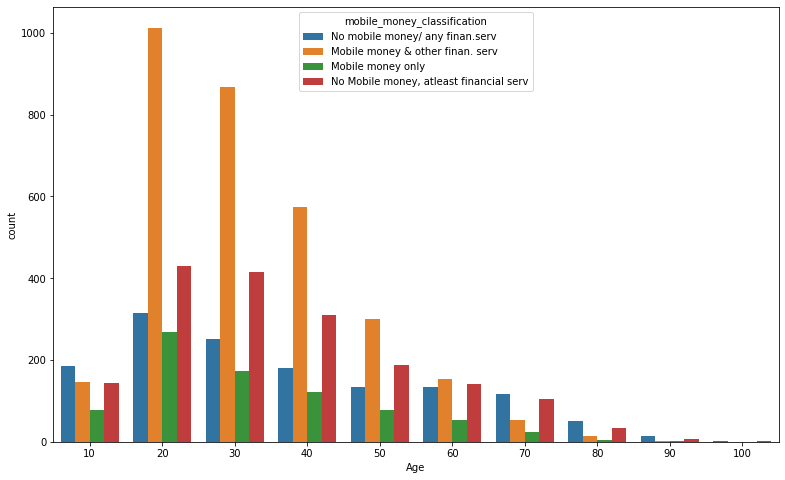

In [18]:
Tanzania['Age'] = Tanzania.Age.apply(lambda x : int(x/10) * 10)
plt.figure(figsize = (13,8))
sns.countplot(x = 'Age', hue = 'mobile_money_classification', data = Tanzania)

* People from the between 20s and 50s are mostly using MOBILE MONEY AND OTHER FINANCIAL SERVICES compared to all clasifications, while people who dont use Mobile money but using atleast  one other financial services are also many compared to those who use ONLY MOBILE MONEY & NO MOBILE OR OTHER FINANCIAL SERVICES

### Mobile money classification vs Gender

Text(0.5, 1, 'Mobile money classification vs Marital Status')

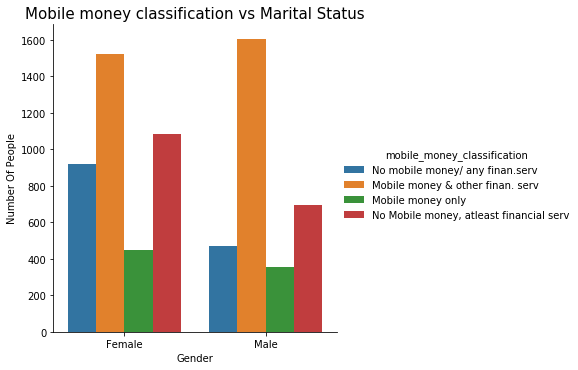

In [19]:

_ = sns.catplot(x='Gender', kind= 'count', hue='mobile_money_classification', data=Tanzania)
plt.xlabel('Gender')
plt.ylabel('Number Of People')
plt.title('Mobile money classification vs Marital Status', fontsize=15)


* MOBILE MONEY AND OTHER FINANCIAL SERVICES is dominated by males, whereas females dominate in other three clasifications.

### Mobile money classification vs Marital Status

Text(0.5, 1, 'Mobile money classification vs Marital_Status')

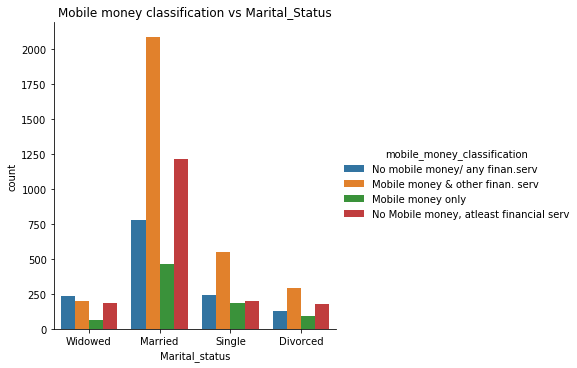

In [20]:
_ = sns.catplot(x='Marital_status',kind='count', hue='mobile_money_classification', data=Tanzania).set(xlabel='Marital_status')
plt.title('Mobile money classification vs Marital_Status')

* In all categories, people who use Mobile money only are the least.
* Mobile money and other financial services is leading in all other catergories except on 'Widowed' individuals

### Mobile money classification vs Land Ownership

Text(34.70776041666667, 0.5, 'Number Of People')

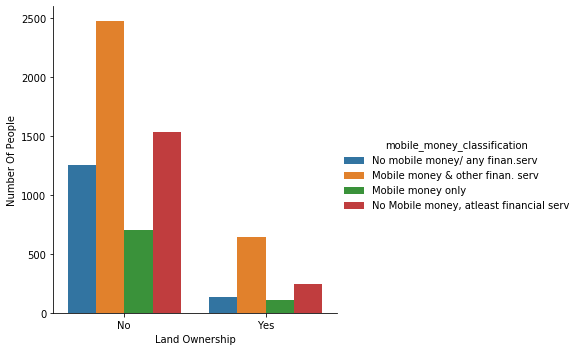

In [21]:
_ = sns.catplot(x='Land_ownership', kind= 'count', hue='mobile_money_classification', data=Tanzania)
plt.xlabel('Land Ownership')
plt.ylabel('Number Of People')

* Mobile money & other financial service catergory dominates in both group of individuals who owns the land and who don't.



### Mobile money classification vs Types of income

Text(0, 0.5, 'Income Type')

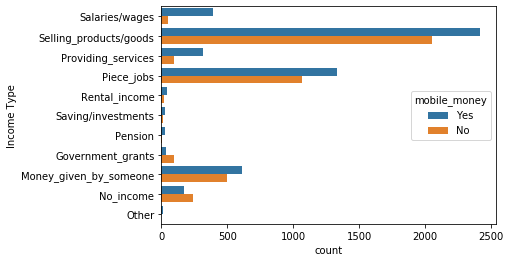

In [22]:
sns.countplot(y='Remuneration', hue= 'mobile_money', data= rem)
plt.ylabel('Income Type')

# Mobile services used in Age, Gender, Marital Status, Land Ownership

Text(0.5, 1.0, 'How often people with land ownership use mobile money for purchases')

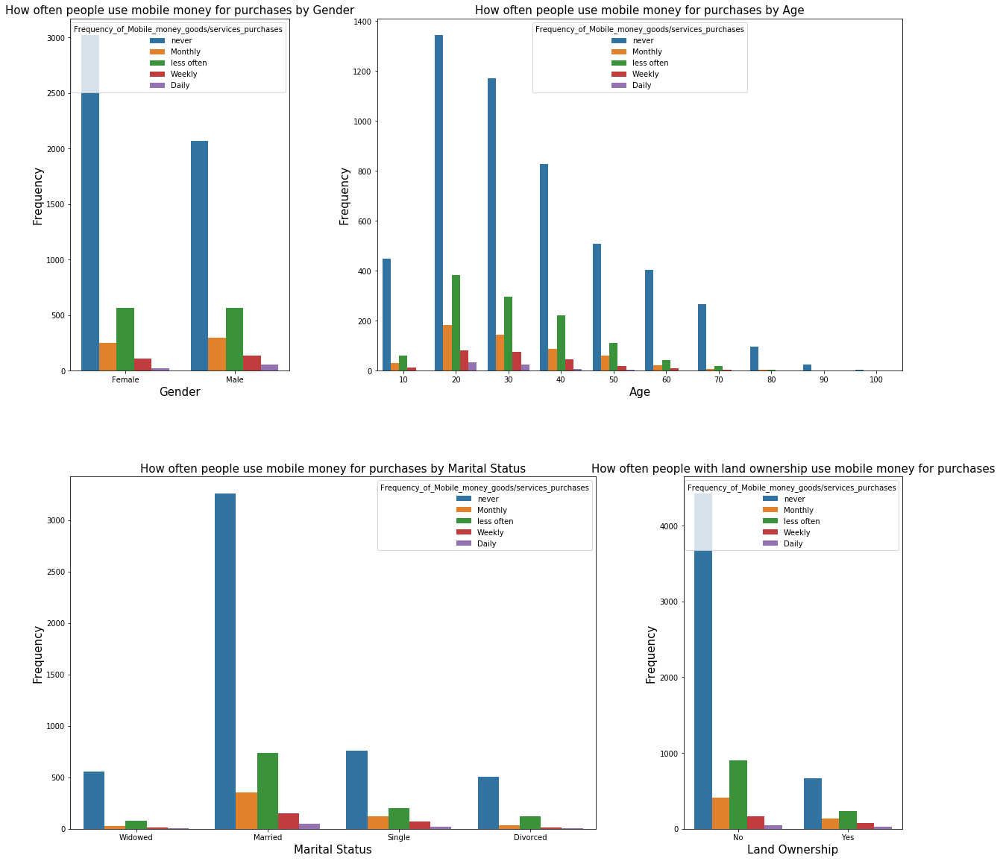

In [23]:
f, axes = plt.subplots(1, 2,figsize=(20, 20))
grid = plt.GridSpec(2, 3, wspace=0.4, hspace=0.3)
plt.subplot(grid[0, 0])
sns.countplot(x='Gender', hue='Frequency_of_Mobile_money_goods/services_purchases', data=Tanzania)
plt.xlabel('Gender', fontsize=15)
plt.ylabel('Frequency', fontsize=15)
plt.title('How often people use mobile money for purchases by Gender', fontsize=15)

plt.subplot(grid[0, 1:])
Tanzania['Age'] = Tanzania.Age.apply(lambda x : int(x/10) * 10)
sns.countplot(x ='Age', hue='Frequency_of_Mobile_money_goods/services_purchases', data = Tanzania)
plt.xlabel('Age', fontsize=15)
plt.ylabel('Frequency', fontsize=15)
plt.title('How often people use mobile money for purchases by Age', fontsize=15)

plt.subplot(grid[1, :2])
sns.countplot(x='Marital_status', hue='Frequency_of_Mobile_money_goods/services_purchases', data = Tanzania)
plt.xlabel('Marital Status', fontsize=15)
plt.ylabel('Frequency', fontsize=15)
plt.title('How often people use mobile money for purchases by Marital Status', fontsize=15)

plt.subplot(grid[1, 2])
sns.countplot(x='Land_ownership', hue='Frequency_of_Mobile_money_goods/services_purchases', data = Tanzania)
plt.xlabel('Land Ownership', fontsize=15)
plt.ylabel('Frequency', fontsize=15)
plt.title('How often people with land ownership use mobile money for purchases', fontsize=15)

* Many people do not use or use less mobile in all catergories
* Very few people use mobile money daily

## 5. Geographic Map

In [24]:
from geopy.geocoders import Nominatim
import folium

lat = -6.3728253 ; long = 34.8924826
Country_map = folium.Map(location=[lat, long], zoom_start=6)


for lat, long, label in zip(Tanzania['Latitude'],Tanzania['Longitude'],'mobile_money_classification'):
    folium.CircleMarker(
        [lat, long],
        radius = 10,
        color = 'green',
        parse_htmtl=False
    ).add_to(Country_map)
Country_map

incidents_accident = folium.map.FeatureGroup()
latitudes = list(Tanzania.Latitude)
longitudes = list(Tanzania.Longitude)
labels = list(Tanzania['mobile_money_classification'])
for lat, lng, label in zip(latitudes, longitudes, labels):
  if label == 'Mobile money only' or 'Mobile money & other finan. serv' :
    folium.Marker(
      location = [lat, lng], 
      popup = label,
      icon = folium.Icon(color='red', icon='o')
     ).add_to(Country_map) 
  else :
    folium.Marker(
      location = [lat, lng], 
      popup = label,
      icon = folium.Icon(color='green', icon='o')
     ).add_to(Country_map)

Country_map

### Conclusion

* Most of the individuals using mobile money are individual who also use other financial services
* Though lage number of people using mobile money are married people, also large number of married individuals are not using mobile money, this means that data is dominated by married individuals compared to other marital status, this issue is also seen 
* Majority of mobile money users use it to purchase compare to payment of bills
* The data was not evenly collected between genders within Gender and Economic status